<a href="https://colab.research.google.com/github/BenPorter165/DCGAN-Color-Image-Generation/blob/main/Abstract_art_generator.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# GAN Training Challenges: DCGAN for Color Images

This is a project that I started to see if I could train an AI to generate abstact art. I found much of this code from Margaret Maynard-Reid (@margaretmz) and I do not claim to own all of this code, this project was done purely for my own curiousity! I have always found image generation cool and I wanted to see how well an AI could generate different kinds of art!

I found my dataset on [Kaggle](https://www.kaggle.com/datasets/bryanb/abstract-art-gallery). The dataset contains 2782 files of abstract images and was posted by bryanb.

## Import

In [ ]:
import tensorflow as tf

from tensorflow import keras
from tensorflow.keras.models import Sequential
from tensorflow.keras import layers
from tensorflow.keras.models import Model
from tensorflow.keras.optimizers import Adam

from matplotlib import pyplot as plt
import numpy as np

import os

Its always a good practice to check the current version of TensorFlow...

In [ ]:
print(tf.version.VERSION)

2.7.0


## Data

We will train the DCGAN on a dataset called [abstract-art-gallery](https://www.kaggle.com/datasets/bryanb/abstract-art-gallery) from Kaggle, which is a collection of abstract art, scraped from https://www.wikiart.org/. 

Here is how to download Kaggle data from Colab:
* Navigate to https://www.kaggle.com. 
* Go to the [account tab](https://www.kaggle.com/me/account)  of your user profile. 
* Select "Create API Token" which triggers the download of kaggle.json, a file containing your API credentials. 
* Enter your username and Kaggle key in the cell below.

In [ ]:
os.environ['KAGGLE_USERNAME']="benporter165" 
os.environ['KAGGLE_KEY']="4350c82c1aef6c1bdc09cbf1b65327aa"

In [ ]:
# download kaggle dataset to 'datasets/' path
!kaggle datasets download -d bryanb/abstract-art-gallery -p datasets

 97% 671M/693M [00:04<00:00, 145MB/s]
100% 693M/693M [00:05<00:00, 145MB/s]


In [ ]:
!unzip datasets/abstract-art-gallery -d datasets/

Archive:  datasets/abstract-art-gallery.zip
  inflating: datasets/Abstract_gallery/Abstract_gallery/Abstract_image_0.jpg  
  inflating: datasets/Abstract_gallery/Abstract_gallery/Abstract_image_1.jpg  
  inflating: datasets/Abstract_gallery/Abstract_gallery/Abstract_image_10.jpg  
  inflating: datasets/Abstract_gallery/Abstract_gallery/Abstract_image_100.jpg  
  inflating: datasets/Abstract_gallery/Abstract_gallery/Abstract_image_1000.jpg  
  inflating: datasets/Abstract_gallery/Abstract_gallery/Abstract_image_1001.jpg  
  inflating: datasets/Abstract_gallery/Abstract_gallery/Abstract_image_1002.jpg  
  inflating: datasets/Abstract_gallery/Abstract_gallery/Abstract_image_1003.jpg  
  inflating: datasets/Abstract_gallery/Abstract_gallery/Abstract_image_1004.jpg  
  inflating: datasets/Abstract_gallery/Abstract_gallery/Abstract_image_1005.jpg  
  inflating: datasets/Abstract_gallery/Abstract_gallery/Abstract_image_1006.jpg  
  inflating: datasets/Abstract_gallery/Abstract_gallery/Abstrac

In [ ]:
Abstract_gallery_dir = "/content/datasets/Abstract_gallery/Abstract_gallery"

In [ ]:
train_images = tf.keras.utils.image_dataset_from_directory(
    Abstract_gallery_dir, label_mode=None, image_size=(64, 64), batch_size=32
)

Found 2782 files belonging to 1 classes.


### Visualization

Here is a visualization of the training data to get an idea of what the images look like. 

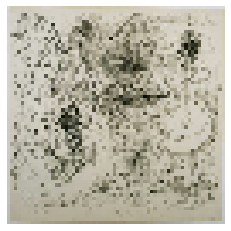

In [ ]:
image_batch = next(iter(train_images))
random_index = np.random.choice(image_batch.shape[0])
random_image = image_batch[random_index].numpy().astype("int32")
plt.axis("off")
plt.imshow(random_image)
plt.show()

### Preprocessing

In [ ]:
# Normalize the images to [-1, 1] which is the range of the tanh activation
train_images = train_images.map(lambda x: (x - 127.5) / 127.5)

## The Generator

Define the generator model architecture with the Keras `Sequential` API.

Use `ReLU` except for the last layer which has `tanh` as the activation.

The job of the generator is to make images, to do so in DCGAN, we feed random noise as input to the generator and upsample till the desired image size becomes 64x64x3.

In [ ]:
# latent dimension of the random noise
LATENT_DIM = 100 
# weight initializer for G per DCGAN paper
WEIGHT_INIT = tf.keras.initializers.RandomNormal(mean=0.0, stddev=0.02) 
# number of channels, 1 for gray scale and 3 for color images
CHANNELS = 3 # UPDATED from 1

In [ ]:
def build_generator():
    # create a Keras Sequential model 
    model = Sequential(name='generator')

    # prepare for reshape: FC => BN => RN layers, note: input shape defined in the 1st Dense layer  
    model.add(layers.Dense(8 * 8 * 512, input_dim=LATENT_DIM))
    # model.add(layers.BatchNormalization())
    model.add(layers.ReLU())
    # layers.LeakyReLU(alpha=0.2),

    # 1D => 3D: reshape the output of the previous layer 
    model.add(layers.Reshape((8, 8, 512)))

    # upsample to 16x16: apply a transposed CONV => BN => RELU
    model.add(layers.Conv2DTranspose(256, (4, 4), strides=(2, 2),padding="same", kernel_initializer=WEIGHT_INIT))
    # model.add(layers.BatchNormalization())
    model.add((layers.ReLU()))

    # upsample to 32x32: apply a transposed CONV => BN => RELU
    model.add(layers.Conv2DTranspose(128, (4, 4), strides=(2, 2),padding="same", kernel_initializer=WEIGHT_INIT))
    # model.add(layers.BatchNormalization())
    model.add((layers.ReLU()))

    # upsample to 64x64: apply a transposed CONV => BN => RELU
    model.add(layers.Conv2DTranspose(64, (4, 4), strides=(2, 2),padding="same", kernel_initializer=WEIGHT_INIT))
    # model.add(layers.BatchNormalization())
    model.add((layers.ReLU()))

    # final layer: Conv2D with tanh activation
    model.add(layers.Conv2D(CHANNELS, (4, 4), padding="same", activation="tanh"))

    # return the generator model
    return model

In [ ]:
# build the generator model
generator = build_generator() 

In [ ]:
generator.summary()

Model: "generator"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense (Dense)               (None, 32768)             3309568   
                                                                 
 re_lu (ReLU)                (None, 32768)             0         
                                                                 
 reshape (Reshape)           (None, 8, 8, 512)         0         
                                                                 
 conv2d_transpose (Conv2DTra  (None, 16, 16, 256)      2097408   
 nspose)                                                         
                                                                 
 re_lu_1 (ReLU)              (None, 16, 16, 256)       0         
                                                                 
 conv2d_transpose_1 (Conv2DT  (None, 32, 32, 128)      524416    
 ranspose)                                               

## The Discriminator

Define the discriminator model architecture with the Keras `Sequential` API

In [ ]:
def build_discriminator(height, width, depth, alpha=0.2):
    # create a Keras Sequential model
    model = Sequential(name='discriminator')
    input_shape = (height, width, depth)

    # 1. first set of CONV => BN => leaky ReLU layers
    model.add(layers.Conv2D(64, (4, 4), padding="same", strides=(2, 2),
        input_shape=input_shape))
    model.add(layers.BatchNormalization())
    model.add(layers.LeakyReLU(alpha=alpha))

    # 2. second set of CONV => BN => leacy ReLU layers
    model.add(layers.Conv2D(128, (4, 4), padding="same", strides=(2, 2)))
    model.add(layers.BatchNormalization())
    model.add(layers.LeakyReLU(alpha=alpha))

    # 3. third set of CONV => BN => leacy ReLU layers
    model.add(layers.Conv2D(128, (4, 4), padding="same", strides=(2, 2)))
    model.add(layers.BatchNormalization())
    model.add(layers.LeakyReLU(alpha=alpha))

    # flatten and apply dropout
    model.add(layers.Flatten())
    model.add(layers.Dropout(0.3))

    # sigmoid in the last layer outputting a single value for binary classification
    model.add(layers.Dense(1, activation="sigmoid"))

    # return the discriminator model
    return model

In [ ]:
# build the discriminator model
discriminator = build_discriminator(64, 64, 3) 

In [ ]:
discriminator.summary()

Model: "discriminator"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_1 (Conv2D)           (None, 32, 32, 64)        3136      
                                                                 
 batch_normalization (BatchN  (None, 32, 32, 64)       256       
 ormalization)                                                   
                                                                 
 leaky_re_lu (LeakyReLU)     (None, 32, 32, 64)        0         
                                                                 
 conv2d_2 (Conv2D)           (None, 16, 16, 128)       131200    
                                                                 
 batch_normalization_1 (Batc  (None, 16, 16, 128)      512       
 hNormalization)                                                 
                                                                 
 leaky_re_lu_1 (LeakyReLU)   (None, 16, 16, 128)     

## DCGAN

### Define the DCGAN class
Subclass `keras.Model` and override `train_step()` to implement the DCGAN architecture. This is where the magic happens and the heart of the DCGAN implementation.

In [ ]:
class DCGAN(keras.Model):
    def __init__(self, discriminator, generator, latent_dim):
        super().__init__()
        self.discriminator = discriminator
        self.generator = generator
        self.latent_dim = latent_dim
        self.d_loss_metric = keras.metrics.Mean(name="d_loss")
        self.g_loss_metric = keras.metrics.Mean(name="g_loss")

    def compile(self, d_optimizer, g_optimizer, loss_fn):
        super(DCGAN, self).compile()
        self.d_optimizer = d_optimizer
        self.g_optimizer = g_optimizer
        self.loss_fn = loss_fn

    @property
    def metrics(self):
        return [self.d_loss_metric, self.g_loss_metric]

    def train_step(self, real_images):

        batch_size = tf.shape(real_images)[0]
        noise = tf.random.normal(shape=(batch_size, self.latent_dim))

        # Step 1. Train the discriminator with both real images (label as 1) and fake images (classified as label as 0) 
        with tf.GradientTape() as tape:
            # Compute discriminator loss on real images
            pred_real = self.discriminator(real_images, training=True)
            real_labels = tf.ones((batch_size, 1))
            # UPDATED: apply one-sided label smoothing to real labels
            real_labels += 0.05 * tf.random.uniform(tf.shape(real_labels)) 
            d_loss_real = self.loss_fn(real_labels, pred_real)

            # Compute discriminator loss on fake images
            fake_images = self.generator(noise)
            pred_fake = self.discriminator(fake_images, training=True)
            fake_labels = tf.zeros((batch_size, 1))
            # UPDATED: add random noise to fake labels - not needed
            # fake_labels += 0.05 * tf.random.uniform(tf.shape(fake_labels)) 
            d_loss_fake = self.loss_fn(fake_labels, pred_fake)

            # total discriminator loss
            d_loss = (d_loss_real + d_loss_fake)/2
        # Compute discriminator gradients
        grads = tape.gradient(d_loss, self.discriminator.trainable_variables)
        # Update discriminator weights
        self.d_optimizer.apply_gradients(zip(grads, self.discriminator.trainable_variables))

        # Step 2. Train the generator (do not update weights of the discriminator)
        misleading_labels = tf.ones((batch_size, 1)) # G wants D to think the fake images are real (label as 1)

        with tf.GradientTape() as tape:
            fake_images = self.generator(noise, training=True)
            pred_fake = self.discriminator(fake_images, training=True)
            g_loss = self.loss_fn(misleading_labels, pred_fake)
        # Compute generator gradients
        grads = tape.gradient(g_loss, self.generator.trainable_variables)
        # Update generator wieghts
        self.g_optimizer.apply_gradients(zip(grads, self.generator.trainable_variables))

        self.d_loss_metric.update_state(d_loss)
        self.g_loss_metric.update_state(g_loss)

        return {"d_loss": self.d_loss_metric.result(), "g_loss": self.g_loss_metric.result()}

### Use Keras Callback to monitor training

The nice thing about overriding `train_step()` of `keras.Model()` is that we can subclass `Callback` to monitor our DCGAN training.

I use the seed noise to create images (with the generator model) throughout the training to see the progress of the generator is making. Also saved the generator model at the end of the training which could potentially be used for inference later.

In [ ]:
class GANMonitor(keras.callbacks.Callback):
    def __init__(self, num_img=3, latent_dim=100):
        self.num_img = num_img
        self.latent_dim = latent_dim

        # Create random noise seed for visualization during traing
        self.seed = tf.random.normal([16, latent_dim])

    def on_epoch_end(self, epoch, logs=None):
        generated_images = self.model.generator(self.seed)
        generated_images = (generated_images * 127.5) + 127.5
        generated_images.numpy()

        fig = plt.figure(figsize=(4, 4))
        for i in range(self.num_img):
            plt.subplot(4, 4, i+1)
            img = keras.utils.array_to_img(generated_images[i]) 
            plt.imshow(img)
            plt.axis('off')
        plt.savefig('epoch_{:03d}.png'.format(epoch)) 
        plt.show()

    def on_train_end(self, logs=None):
        self.model.generator.save('generator.h5')

### The DCGAN model - putting it together

In [ ]:
dcgan = DCGAN(discriminator=discriminator, generator=generator, latent_dim=LATENT_DIM)

## Compile DCGAN

Compile the dcgan model, use the `Adam` optimizer, learning rate of 0.0002, and the **Binary Cross Entropy**.

In [ ]:
D_LR = 0.0001 # UPDATED: discriminator learning rate
G_LR = 0.0003 # UPDATED: generator learning rate

dcgan.compile(
    d_optimizer=keras.optimizers.Adam(learning_rate=D_LR, beta_1 = 0.5),
    g_optimizer=keras.optimizers.Adam(learning_rate=G_LR, beta_1 = 0.5),  
    loss_fn=keras.losses.BinaryCrossentropy(),
)

## Train DCGAN
Now we simply call `model.fit()` to traing the dcgan model!

Epoch 1/150
87/87 [==============================] - ETA: 0s - d_loss: 0.7208 - g_loss: 0.8179

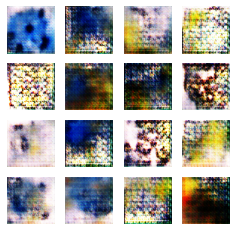

87/87 [==============================] - 13s 121ms/step - d_loss: 0.7208 - g_loss: 0.8179
Epoch 2/150
87/87 [==============================] - ETA: 0s - d_loss: 0.7227 - g_loss: 0.8037

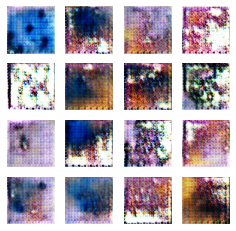

87/87 [==============================] - 11s 115ms/step - d_loss: 0.7227 - g_loss: 0.8037
Epoch 3/150
87/87 [==============================] - ETA: 0s - d_loss: 0.7110 - g_loss: 0.8373

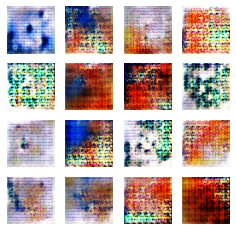

87/87 [==============================] - 11s 120ms/step - d_loss: 0.7110 - g_loss: 0.8373
Epoch 4/150
87/87 [==============================] - ETA: 0s - d_loss: 0.7180 - g_loss: 0.8151

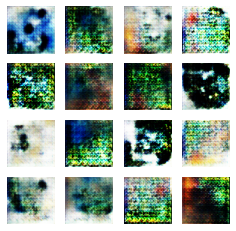

87/87 [==============================] - 11s 114ms/step - d_loss: 0.7180 - g_loss: 0.8151
Epoch 5/150
87/87 [==============================] - ETA: 0s - d_loss: 0.7030 - g_loss: 0.8574

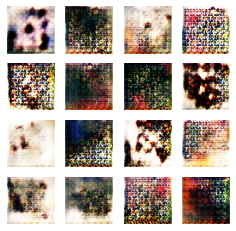

87/87 [==============================] - 11s 119ms/step - d_loss: 0.7030 - g_loss: 0.8574
Epoch 6/150
87/87 [==============================] - ETA: 0s - d_loss: 0.7120 - g_loss: 0.8246

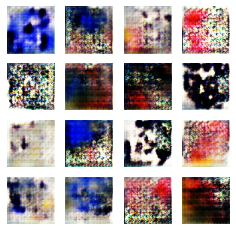

87/87 [==============================] - 12s 123ms/step - d_loss: 0.7120 - g_loss: 0.8246
Epoch 7/150
87/87 [==============================] - ETA: 0s - d_loss: 0.7049 - g_loss: 0.8014

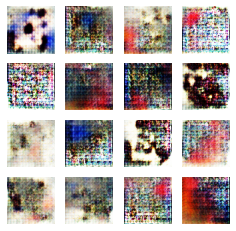

87/87 [==============================] - 11s 120ms/step - d_loss: 0.7049 - g_loss: 0.8014
Epoch 8/150
87/87 [==============================] - ETA: 0s - d_loss: 0.7037 - g_loss: 0.8178

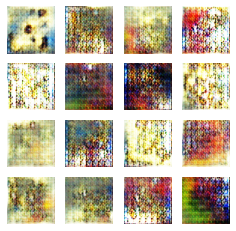

87/87 [==============================] - 12s 123ms/step - d_loss: 0.7037 - g_loss: 0.8178
Epoch 9/150
87/87 [==============================] - ETA: 0s - d_loss: 0.6828 - g_loss: 0.8226

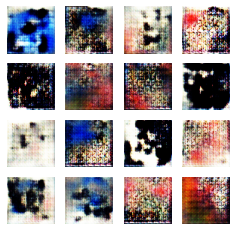

87/87 [==============================] - 12s 125ms/step - d_loss: 0.6828 - g_loss: 0.8226
Epoch 10/150
87/87 [==============================] - ETA: 0s - d_loss: 0.7072 - g_loss: 0.8197

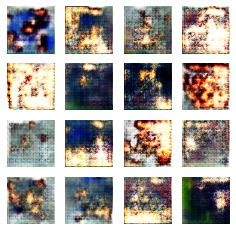

87/87 [==============================] - 12s 123ms/step - d_loss: 0.7072 - g_loss: 0.8197
Epoch 11/150
87/87 [==============================] - ETA: 0s - d_loss: 0.6843 - g_loss: 0.8353

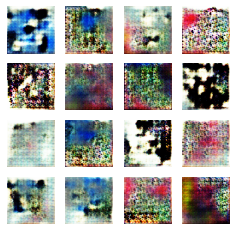

87/87 [==============================] - 12s 123ms/step - d_loss: 0.6843 - g_loss: 0.8353
Epoch 12/150
87/87 [==============================] - ETA: 0s - d_loss: 0.6916 - g_loss: 0.8459

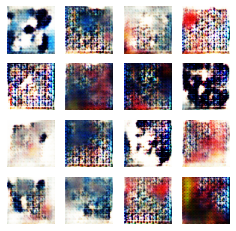

87/87 [==============================] - 11s 120ms/step - d_loss: 0.6916 - g_loss: 0.8459
Epoch 13/150
87/87 [==============================] - ETA: 0s - d_loss: 0.6936 - g_loss: 0.8507

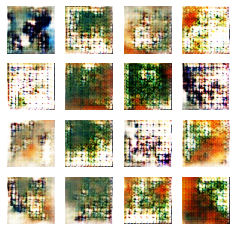

87/87 [==============================] - 12s 124ms/step - d_loss: 0.6936 - g_loss: 0.8507
Epoch 14/150
87/87 [==============================] - ETA: 0s - d_loss: 0.6762 - g_loss: 0.8712

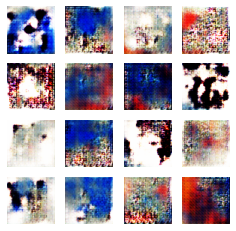

87/87 [==============================] - 12s 130ms/step - d_loss: 0.6762 - g_loss: 0.8712
Epoch 15/150
87/87 [==============================] - ETA: 0s - d_loss: 0.7080 - g_loss: 0.8576

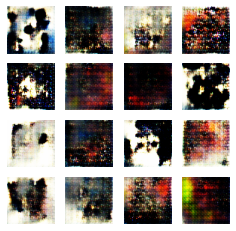

87/87 [==============================] - 12s 122ms/step - d_loss: 0.7080 - g_loss: 0.8576
Epoch 16/150
87/87 [==============================] - ETA: 0s - d_loss: 0.6903 - g_loss: 0.8405

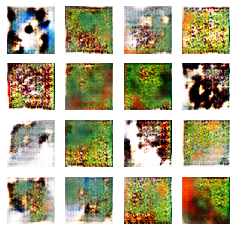

87/87 [==============================] - 12s 125ms/step - d_loss: 0.6903 - g_loss: 0.8405
Epoch 17/150
87/87 [==============================] - ETA: 0s - d_loss: 0.6915 - g_loss: 0.8460

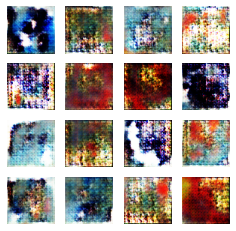

87/87 [==============================] - 15s 158ms/step - d_loss: 0.6915 - g_loss: 0.8460
Epoch 18/150
87/87 [==============================] - ETA: 0s - d_loss: 0.7043 - g_loss: 0.8242

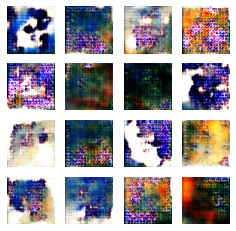

87/87 [==============================] - 12s 129ms/step - d_loss: 0.7043 - g_loss: 0.8242
Epoch 19/150
87/87 [==============================] - ETA: 0s - d_loss: 0.6874 - g_loss: 0.8379

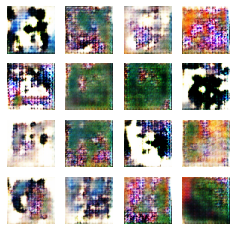

87/87 [==============================] - 12s 130ms/step - d_loss: 0.6874 - g_loss: 0.8379
Epoch 20/150
87/87 [==============================] - ETA: 0s - d_loss: 0.6803 - g_loss: 0.8634

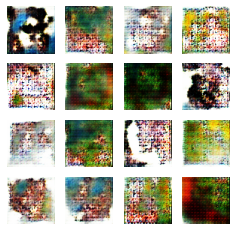

87/87 [==============================] - 12s 130ms/step - d_loss: 0.6803 - g_loss: 0.8634
Epoch 21/150
87/87 [==============================] - ETA: 0s - d_loss: 0.7056 - g_loss: 0.8220

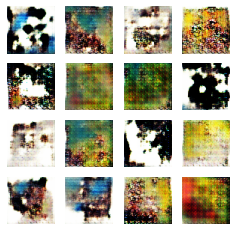

87/87 [==============================] - 13s 134ms/step - d_loss: 0.7056 - g_loss: 0.8220
Epoch 22/150
87/87 [==============================] - ETA: 0s - d_loss: 0.6972 - g_loss: 0.8389

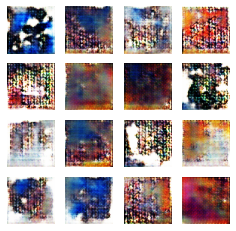

87/87 [==============================] - 12s 130ms/step - d_loss: 0.6972 - g_loss: 0.8389
Epoch 23/150
87/87 [==============================] - ETA: 0s - d_loss: 0.6916 - g_loss: 0.8539

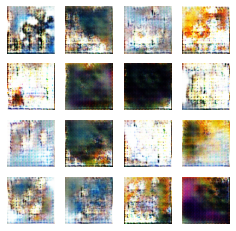

87/87 [==============================] - 13s 133ms/step - d_loss: 0.6916 - g_loss: 0.8539
Epoch 24/150
87/87 [==============================] - ETA: 0s - d_loss: 0.6799 - g_loss: 0.8686

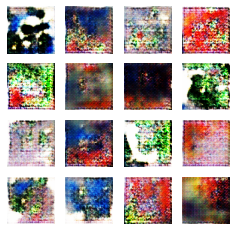

87/87 [==============================] - 13s 136ms/step - d_loss: 0.6799 - g_loss: 0.8686
Epoch 25/150
87/87 [==============================] - ETA: 0s - d_loss: 0.6889 - g_loss: 0.8455

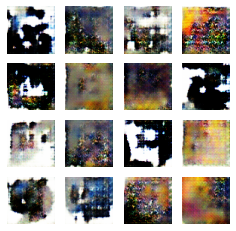

87/87 [==============================] - 13s 136ms/step - d_loss: 0.6889 - g_loss: 0.8455
Epoch 26/150
87/87 [==============================] - ETA: 0s - d_loss: 0.6928 - g_loss: 0.8229

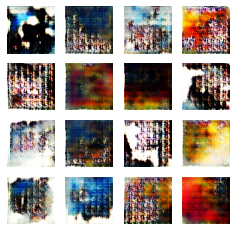

87/87 [==============================] - 12s 131ms/step - d_loss: 0.6928 - g_loss: 0.8229
Epoch 27/150
87/87 [==============================] - ETA: 0s - d_loss: 0.6994 - g_loss: 0.8529

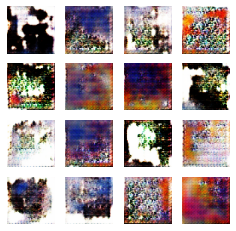

87/87 [==============================] - 13s 136ms/step - d_loss: 0.6994 - g_loss: 0.8529
Epoch 28/150
87/87 [==============================] - ETA: 0s - d_loss: 0.6855 - g_loss: 0.8616

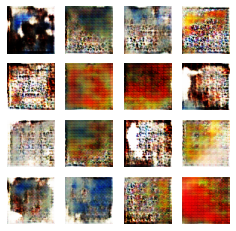

87/87 [==============================] - 13s 139ms/step - d_loss: 0.6855 - g_loss: 0.8616
Epoch 29/150
87/87 [==============================] - ETA: 0s - d_loss: 0.6933 - g_loss: 0.8453

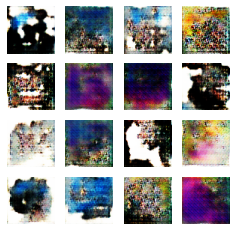

87/87 [==============================] - 12s 130ms/step - d_loss: 0.6933 - g_loss: 0.8453
Epoch 30/150
87/87 [==============================] - ETA: 0s - d_loss: 0.6939 - g_loss: 0.8474

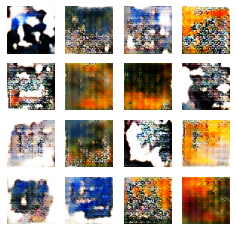

87/87 [==============================] - 13s 138ms/step - d_loss: 0.6939 - g_loss: 0.8474
Epoch 31/150
87/87 [==============================] - ETA: 0s - d_loss: 0.6776 - g_loss: 0.9011

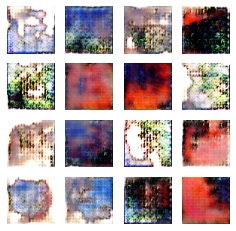

87/87 [==============================] - 13s 137ms/step - d_loss: 0.6776 - g_loss: 0.9011
Epoch 32/150
87/87 [==============================] - ETA: 0s - d_loss: 0.6746 - g_loss: 0.8899

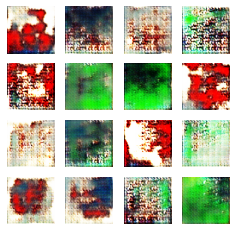

87/87 [==============================] - 13s 141ms/step - d_loss: 0.6746 - g_loss: 0.8899
Epoch 33/150
87/87 [==============================] - ETA: 0s - d_loss: 0.6883 - g_loss: 0.8482

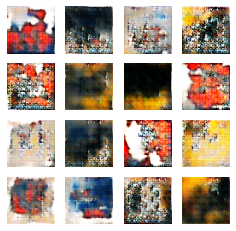

87/87 [==============================] - 13s 139ms/step - d_loss: 0.6883 - g_loss: 0.8482
Epoch 34/150
87/87 [==============================] - ETA: 0s - d_loss: 0.6884 - g_loss: 0.8542

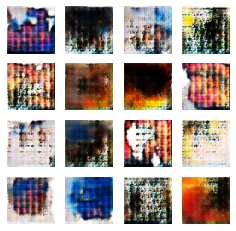

87/87 [==============================] - 13s 139ms/step - d_loss: 0.6884 - g_loss: 0.8542
Epoch 35/150
87/87 [==============================] - ETA: 0s - d_loss: 0.6773 - g_loss: 0.9060

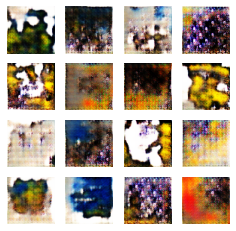

87/87 [==============================] - 13s 138ms/step - d_loss: 0.6773 - g_loss: 0.9060
Epoch 36/150
87/87 [==============================] - ETA: 0s - d_loss: 0.6901 - g_loss: 0.8592

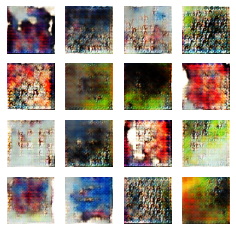

87/87 [==============================] - 13s 141ms/step - d_loss: 0.6901 - g_loss: 0.8592
Epoch 37/150
87/87 [==============================] - ETA: 0s - d_loss: 0.6668 - g_loss: 0.9181

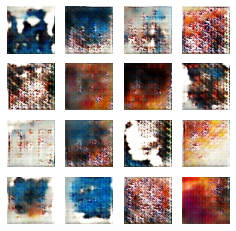

87/87 [==============================] - 13s 136ms/step - d_loss: 0.6668 - g_loss: 0.9181
Epoch 38/150
87/87 [==============================] - ETA: 0s - d_loss: 0.6646 - g_loss: 0.9204

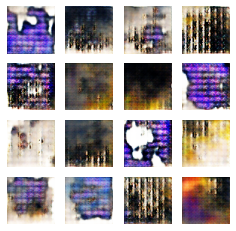

87/87 [==============================] - 13s 141ms/step - d_loss: 0.6646 - g_loss: 0.9204
Epoch 39/150
87/87 [==============================] - ETA: 0s - d_loss: 0.6579 - g_loss: 0.9403

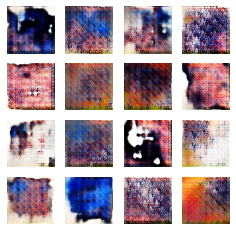

87/87 [==============================] - 14s 147ms/step - d_loss: 0.6579 - g_loss: 0.9403
Epoch 40/150
87/87 [==============================] - ETA: 0s - d_loss: 0.6732 - g_loss: 0.9090

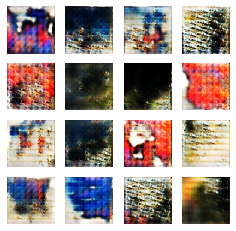

87/87 [==============================] - 14s 144ms/step - d_loss: 0.6732 - g_loss: 0.9090
Epoch 41/150
87/87 [==============================] - ETA: 0s - d_loss: 0.6606 - g_loss: 0.9328

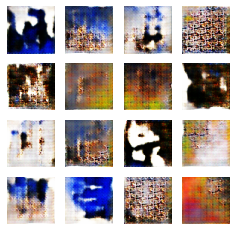

87/87 [==============================] - 13s 141ms/step - d_loss: 0.6606 - g_loss: 0.9328
Epoch 42/150
87/87 [==============================] - ETA: 0s - d_loss: 0.6574 - g_loss: 0.9410

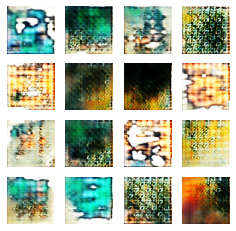

87/87 [==============================] - 14s 147ms/step - d_loss: 0.6574 - g_loss: 0.9410
Epoch 43/150
87/87 [==============================] - ETA: 0s - d_loss: 0.6857 - g_loss: 0.9170

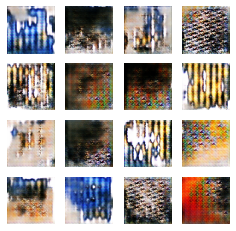

87/87 [==============================] - 13s 143ms/step - d_loss: 0.6857 - g_loss: 0.9170
Epoch 44/150
87/87 [==============================] - ETA: 0s - d_loss: 0.6884 - g_loss: 0.8836

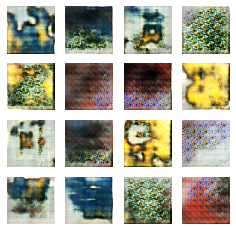

87/87 [==============================] - 14s 146ms/step - d_loss: 0.6884 - g_loss: 0.8836
Epoch 45/150
87/87 [==============================] - ETA: 0s - d_loss: 0.6975 - g_loss: 0.8654

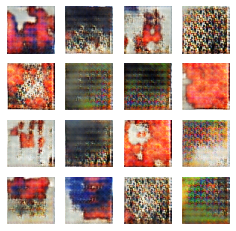

87/87 [==============================] - 14s 149ms/step - d_loss: 0.6975 - g_loss: 0.8654
Epoch 46/150
87/87 [==============================] - ETA: 0s - d_loss: 0.6644 - g_loss: 0.9121

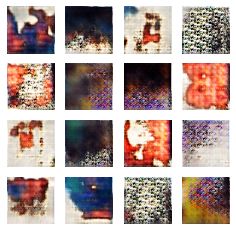

87/87 [==============================] - 14s 151ms/step - d_loss: 0.6644 - g_loss: 0.9121
Epoch 47/150
87/87 [==============================] - ETA: 0s - d_loss: 0.6820 - g_loss: 0.8565

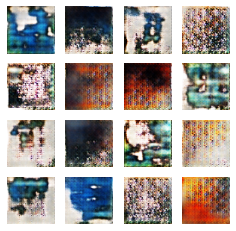

87/87 [==============================] - 14s 153ms/step - d_loss: 0.6820 - g_loss: 0.8565
Epoch 48/150
87/87 [==============================] - ETA: 0s - d_loss: 0.6883 - g_loss: 0.8474

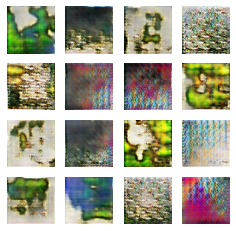

87/87 [==============================] - 14s 151ms/step - d_loss: 0.6883 - g_loss: 0.8474
Epoch 49/150
87/87 [==============================] - ETA: 0s - d_loss: 0.6909 - g_loss: 0.8472

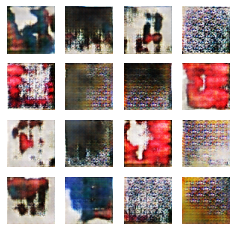

87/87 [==============================] - 14s 153ms/step - d_loss: 0.6909 - g_loss: 0.8472
Epoch 50/150
87/87 [==============================] - ETA: 0s - d_loss: 0.6893 - g_loss: 0.8157

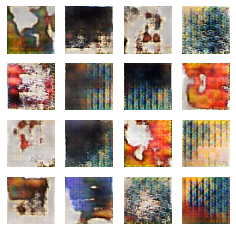

87/87 [==============================] - 14s 153ms/step - d_loss: 0.6893 - g_loss: 0.8157
Epoch 51/150
87/87 [==============================] - ETA: 0s - d_loss: 0.6879 - g_loss: 0.8271

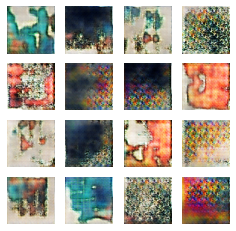

87/87 [==============================] - 14s 148ms/step - d_loss: 0.6879 - g_loss: 0.8271
Epoch 52/150
87/87 [==============================] - ETA: 0s - d_loss: 0.6760 - g_loss: 0.8417

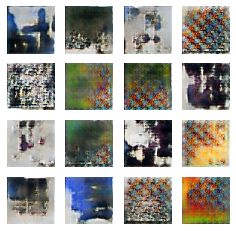

87/87 [==============================] - 14s 149ms/step - d_loss: 0.6760 - g_loss: 0.8417
Epoch 53/150
87/87 [==============================] - ETA: 0s - d_loss: 0.6838 - g_loss: 0.8622

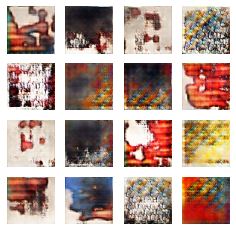

87/87 [==============================] - 14s 153ms/step - d_loss: 0.6838 - g_loss: 0.8622
Epoch 54/150
87/87 [==============================] - ETA: 0s - d_loss: 0.6823 - g_loss: 0.8316

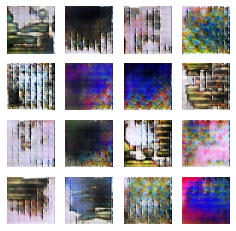

87/87 [==============================] - 14s 154ms/step - d_loss: 0.6823 - g_loss: 0.8316
Epoch 55/150
87/87 [==============================] - ETA: 0s - d_loss: 0.6863 - g_loss: 0.8526

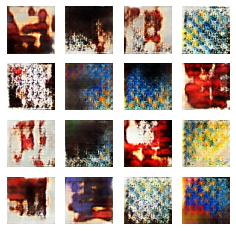

87/87 [==============================] - 14s 150ms/step - d_loss: 0.6863 - g_loss: 0.8526
Epoch 56/150
87/87 [==============================] - ETA: 0s - d_loss: 0.6965 - g_loss: 0.7995

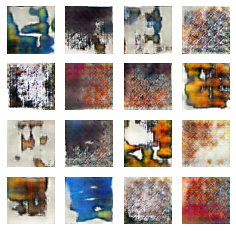

87/87 [==============================] - 14s 150ms/step - d_loss: 0.6965 - g_loss: 0.7995
Epoch 57/150
87/87 [==============================] - ETA: 0s - d_loss: 0.6871 - g_loss: 0.8091

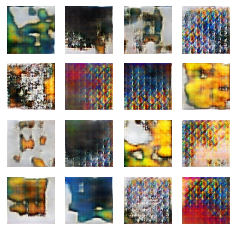

87/87 [==============================] - 14s 154ms/step - d_loss: 0.6871 - g_loss: 0.8091
Epoch 58/150
87/87 [==============================] - ETA: 0s - d_loss: 0.6862 - g_loss: 0.8206

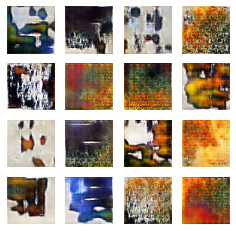

87/87 [==============================] - 14s 151ms/step - d_loss: 0.6862 - g_loss: 0.8206
Epoch 59/150
87/87 [==============================] - ETA: 0s - d_loss: 0.6765 - g_loss: 0.8269

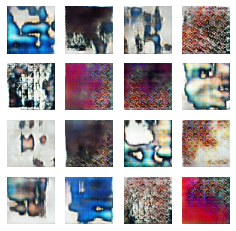

87/87 [==============================] - 14s 155ms/step - d_loss: 0.6765 - g_loss: 0.8269
Epoch 60/150
87/87 [==============================] - ETA: 0s - d_loss: 0.6880 - g_loss: 0.8107

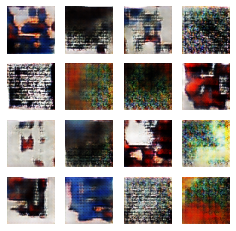

87/87 [==============================] - 15s 158ms/step - d_loss: 0.6880 - g_loss: 0.8107
Epoch 61/150
87/87 [==============================] - ETA: 0s - d_loss: 0.6903 - g_loss: 0.8256

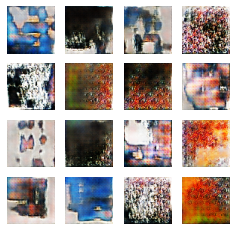

87/87 [==============================] - 15s 162ms/step - d_loss: 0.6903 - g_loss: 0.8256
Epoch 62/150
87/87 [==============================] - ETA: 0s - d_loss: 0.6687 - g_loss: 0.8408

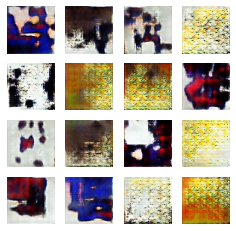

87/87 [==============================] - 15s 162ms/step - d_loss: 0.6687 - g_loss: 0.8408
Epoch 63/150
87/87 [==============================] - ETA: 0s - d_loss: 0.6870 - g_loss: 0.8265

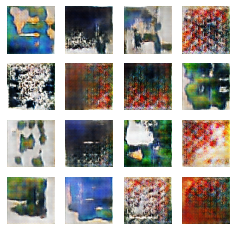

87/87 [==============================] - 15s 164ms/step - d_loss: 0.6870 - g_loss: 0.8265
Epoch 64/150
87/87 [==============================] - ETA: 0s - d_loss: 0.7012 - g_loss: 0.8034

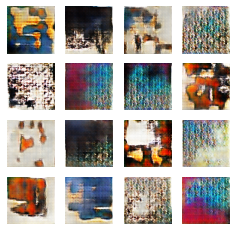

87/87 [==============================] - 15s 163ms/step - d_loss: 0.7012 - g_loss: 0.8034
Epoch 65/150
87/87 [==============================] - ETA: 0s - d_loss: 0.6937 - g_loss: 0.8122

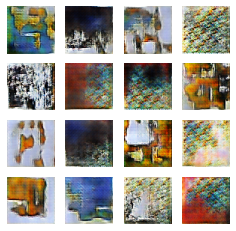

87/87 [==============================] - 16s 167ms/step - d_loss: 0.6937 - g_loss: 0.8122
Epoch 66/150
87/87 [==============================] - ETA: 0s - d_loss: 0.6872 - g_loss: 0.8082

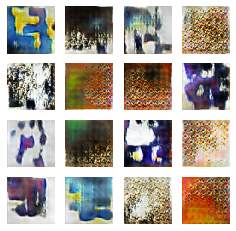

87/87 [==============================] - 15s 165ms/step - d_loss: 0.6872 - g_loss: 0.8082
Epoch 67/150
87/87 [==============================] - ETA: 0s - d_loss: 0.6915 - g_loss: 0.8014

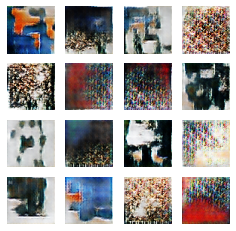

87/87 [==============================] - 15s 160ms/step - d_loss: 0.6915 - g_loss: 0.8014
Epoch 68/150
87/87 [==============================] - ETA: 0s - d_loss: 0.6954 - g_loss: 0.8032

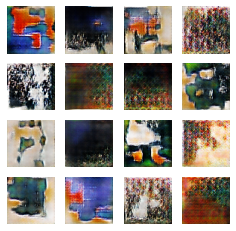

87/87 [==============================] - 15s 165ms/step - d_loss: 0.6954 - g_loss: 0.8032
Epoch 69/150
87/87 [==============================] - ETA: 0s - d_loss: 0.6902 - g_loss: 0.7955

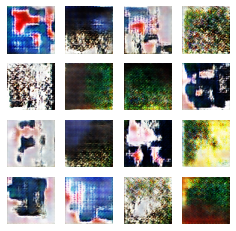

87/87 [==============================] - 15s 166ms/step - d_loss: 0.6902 - g_loss: 0.7955
Epoch 70/150
87/87 [==============================] - ETA: 0s - d_loss: 0.6854 - g_loss: 0.7920

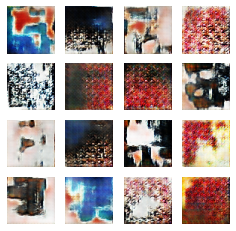

87/87 [==============================] - 15s 165ms/step - d_loss: 0.6854 - g_loss: 0.7920
Epoch 71/150
87/87 [==============================] - ETA: 0s - d_loss: 0.6888 - g_loss: 0.7954

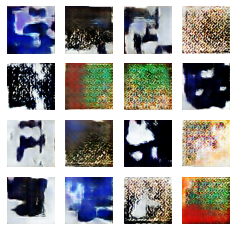

87/87 [==============================] - 15s 165ms/step - d_loss: 0.6888 - g_loss: 0.7954
Epoch 72/150
87/87 [==============================] - ETA: 0s - d_loss: 0.6866 - g_loss: 0.8233

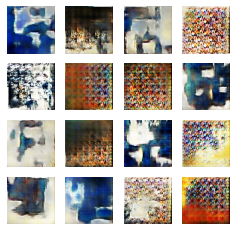

87/87 [==============================] - 16s 167ms/step - d_loss: 0.6866 - g_loss: 0.8233
Epoch 73/150
87/87 [==============================] - ETA: 0s - d_loss: 0.6835 - g_loss: 0.8212

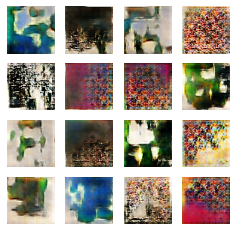

87/87 [==============================] - 15s 165ms/step - d_loss: 0.6835 - g_loss: 0.8212
Epoch 74/150
87/87 [==============================] - ETA: 0s - d_loss: 0.6945 - g_loss: 0.7836

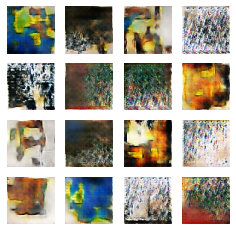

87/87 [==============================] - 16s 168ms/step - d_loss: 0.6945 - g_loss: 0.7836
Epoch 75/150
87/87 [==============================] - ETA: 0s - d_loss: 0.6959 - g_loss: 0.7819

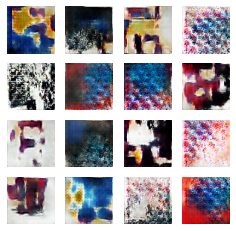

87/87 [==============================] - 15s 165ms/step - d_loss: 0.6959 - g_loss: 0.7819
Epoch 76/150
87/87 [==============================] - ETA: 0s - d_loss: 0.6919 - g_loss: 0.7907

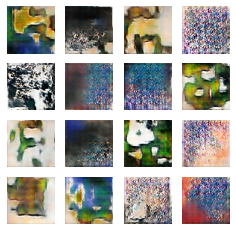

87/87 [==============================] - 16s 171ms/step - d_loss: 0.6919 - g_loss: 0.7907
Epoch 77/150
87/87 [==============================] - ETA: 0s - d_loss: 0.6872 - g_loss: 0.7834

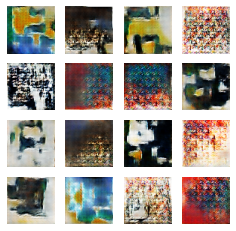

87/87 [==============================] - 16s 169ms/step - d_loss: 0.6872 - g_loss: 0.7834
Epoch 78/150
87/87 [==============================] - ETA: 0s - d_loss: 0.6804 - g_loss: 0.7876

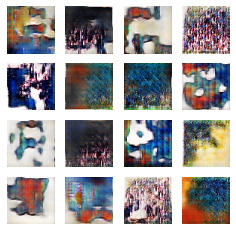

87/87 [==============================] - 15s 163ms/step - d_loss: 0.6804 - g_loss: 0.7876
Epoch 79/150
87/87 [==============================] - ETA: 0s - d_loss: 0.6804 - g_loss: 0.8133

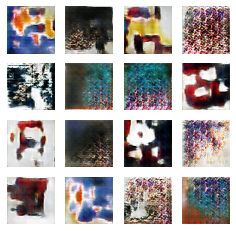

87/87 [==============================] - 16s 172ms/step - d_loss: 0.6804 - g_loss: 0.8133
Epoch 80/150
87/87 [==============================] - ETA: 0s - d_loss: 0.6864 - g_loss: 0.7880

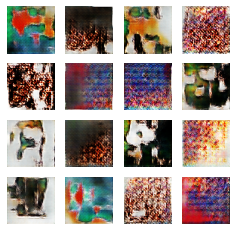

87/87 [==============================] - 16s 174ms/step - d_loss: 0.6864 - g_loss: 0.7880
Epoch 81/150
87/87 [==============================] - ETA: 0s - d_loss: 0.6878 - g_loss: 0.7996

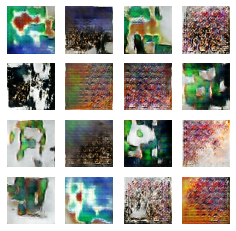

87/87 [==============================] - 15s 166ms/step - d_loss: 0.6878 - g_loss: 0.7996
Epoch 82/150
87/87 [==============================] - ETA: 0s - d_loss: 0.6915 - g_loss: 0.8072

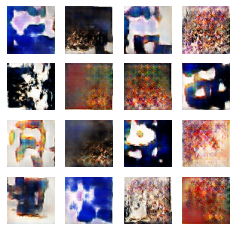

87/87 [==============================] - 16s 171ms/step - d_loss: 0.6915 - g_loss: 0.8072
Epoch 83/150
87/87 [==============================] - ETA: 0s - d_loss: 0.6805 - g_loss: 0.8145

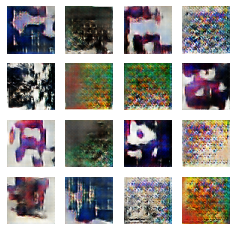

87/87 [==============================] - 16s 174ms/step - d_loss: 0.6805 - g_loss: 0.8145
Epoch 84/150
87/87 [==============================] - ETA: 0s - d_loss: 0.6906 - g_loss: 0.7980

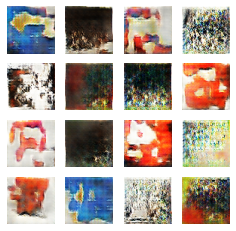

87/87 [==============================] - 16s 175ms/step - d_loss: 0.6906 - g_loss: 0.7980
Epoch 85/150
87/87 [==============================] - ETA: 0s - d_loss: 0.6891 - g_loss: 0.8004

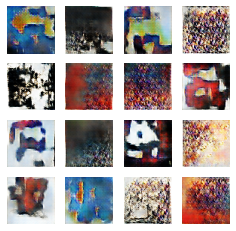

87/87 [==============================] - 16s 175ms/step - d_loss: 0.6891 - g_loss: 0.8004
Epoch 86/150
87/87 [==============================] - ETA: 0s - d_loss: 0.6822 - g_loss: 0.8012

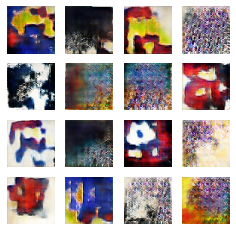

87/87 [==============================] - 16s 176ms/step - d_loss: 0.6822 - g_loss: 0.8012
Epoch 87/150
87/87 [==============================] - ETA: 0s - d_loss: 0.6893 - g_loss: 0.7961

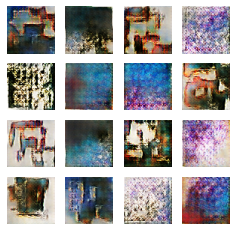

87/87 [==============================] - 17s 178ms/step - d_loss: 0.6893 - g_loss: 0.7961
Epoch 88/150
87/87 [==============================] - ETA: 0s - d_loss: 0.6836 - g_loss: 0.8120

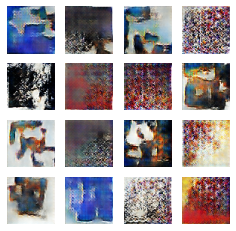

87/87 [==============================] - 16s 169ms/step - d_loss: 0.6836 - g_loss: 0.8120
Epoch 89/150
87/87 [==============================] - ETA: 0s - d_loss: 0.6788 - g_loss: 0.8143

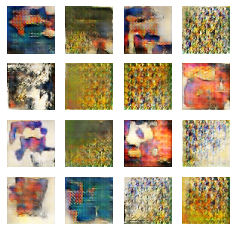

87/87 [==============================] - 16s 176ms/step - d_loss: 0.6788 - g_loss: 0.8143
Epoch 90/150
87/87 [==============================] - ETA: 0s - d_loss: 0.6789 - g_loss: 0.8113

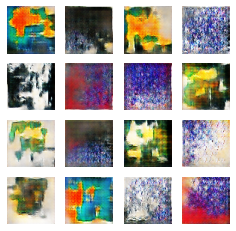

87/87 [==============================] - 16s 177ms/step - d_loss: 0.6789 - g_loss: 0.8113
Epoch 91/150
87/87 [==============================] - ETA: 0s - d_loss: 0.6740 - g_loss: 0.8178

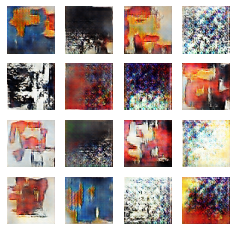

87/87 [==============================] - 17s 182ms/step - d_loss: 0.6740 - g_loss: 0.8178
Epoch 92/150
87/87 [==============================] - ETA: 0s - d_loss: 0.6840 - g_loss: 0.8036

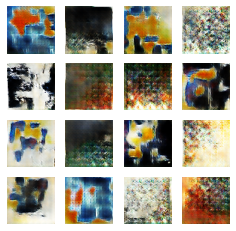

87/87 [==============================] - 16s 178ms/step - d_loss: 0.6840 - g_loss: 0.8036
Epoch 93/150
87/87 [==============================] - ETA: 0s - d_loss: 0.6766 - g_loss: 0.8151

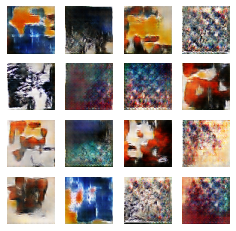

87/87 [==============================] - 17s 182ms/step - d_loss: 0.6766 - g_loss: 0.8151
Epoch 94/150
87/87 [==============================] - ETA: 0s - d_loss: 0.6803 - g_loss: 0.8073

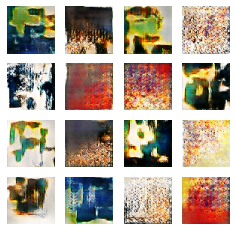

87/87 [==============================] - 17s 179ms/step - d_loss: 0.6803 - g_loss: 0.8073
Epoch 95/150
87/87 [==============================] - ETA: 0s - d_loss: 0.6819 - g_loss: 0.8021

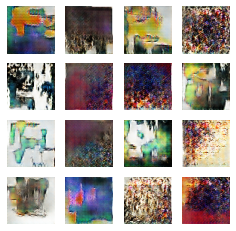

87/87 [==============================] - 17s 181ms/step - d_loss: 0.6819 - g_loss: 0.8021
Epoch 96/150
87/87 [==============================] - ETA: 0s - d_loss: 0.6800 - g_loss: 0.8141

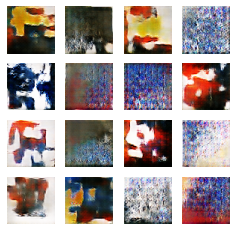

87/87 [==============================] - 17s 181ms/step - d_loss: 0.6800 - g_loss: 0.8141
Epoch 97/150
87/87 [==============================] - ETA: 0s - d_loss: 0.6704 - g_loss: 0.8203

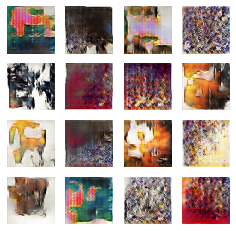

87/87 [==============================] - 17s 182ms/step - d_loss: 0.6704 - g_loss: 0.8203
Epoch 98/150
87/87 [==============================] - ETA: 0s - d_loss: 0.6663 - g_loss: 0.8427

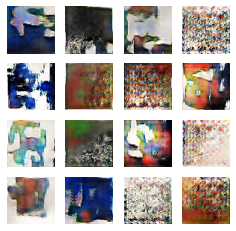

87/87 [==============================] - 17s 188ms/step - d_loss: 0.6663 - g_loss: 0.8427
Epoch 99/150
87/87 [==============================] - ETA: 0s - d_loss: 0.6637 - g_loss: 0.8383

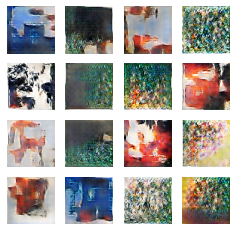

87/87 [==============================] - 17s 184ms/step - d_loss: 0.6637 - g_loss: 0.8383
Epoch 100/150
87/87 [==============================] - ETA: 0s - d_loss: 0.6625 - g_loss: 0.8591

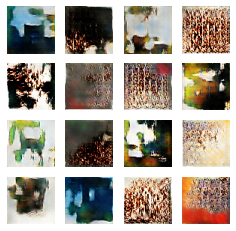

87/87 [==============================] - 17s 184ms/step - d_loss: 0.6625 - g_loss: 0.8591
Epoch 101/150
87/87 [==============================] - ETA: 0s - d_loss: 0.6663 - g_loss: 0.8544

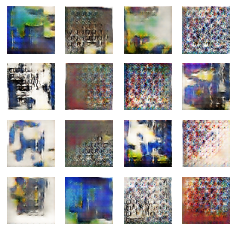

87/87 [==============================] - 17s 183ms/step - d_loss: 0.6663 - g_loss: 0.8544
Epoch 102/150
87/87 [==============================] - ETA: 0s - d_loss: 0.6538 - g_loss: 0.8576

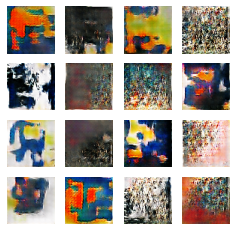

87/87 [==============================] - 17s 188ms/step - d_loss: 0.6538 - g_loss: 0.8576
Epoch 103/150
87/87 [==============================] - ETA: 0s - d_loss: 0.6738 - g_loss: 0.8327

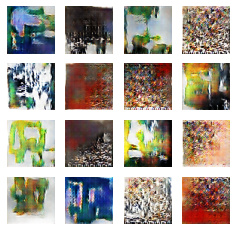

87/87 [==============================] - 17s 184ms/step - d_loss: 0.6738 - g_loss: 0.8327
Epoch 104/150
87/87 [==============================] - ETA: 0s - d_loss: 0.6681 - g_loss: 0.8412

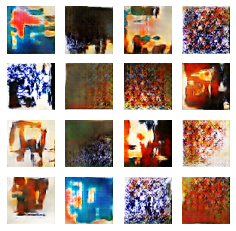

87/87 [==============================] - 17s 186ms/step - d_loss: 0.6681 - g_loss: 0.8412
Epoch 105/150
87/87 [==============================] - ETA: 0s - d_loss: 0.6648 - g_loss: 0.8437

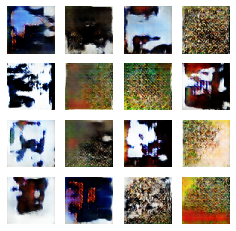

87/87 [==============================] - 18s 191ms/step - d_loss: 0.6648 - g_loss: 0.8437
Epoch 106/150
87/87 [==============================] - ETA: 0s - d_loss: 0.6713 - g_loss: 0.8490

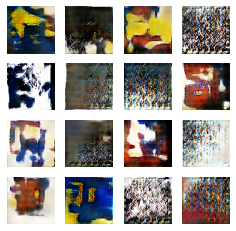

87/87 [==============================] - 17s 185ms/step - d_loss: 0.6713 - g_loss: 0.8490
Epoch 107/150
87/87 [==============================] - ETA: 0s - d_loss: 0.6546 - g_loss: 0.8560

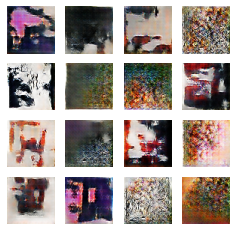

87/87 [==============================] - 17s 189ms/step - d_loss: 0.6546 - g_loss: 0.8560
Epoch 108/150
87/87 [==============================] - ETA: 0s - d_loss: 0.6683 - g_loss: 0.8672

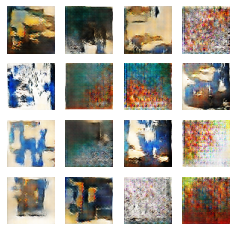

87/87 [==============================] - 18s 191ms/step - d_loss: 0.6683 - g_loss: 0.8672
Epoch 109/150
87/87 [==============================] - ETA: 0s - d_loss: 0.6478 - g_loss: 0.8697

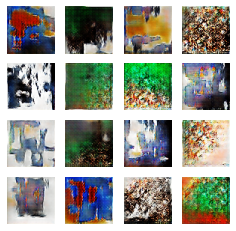

87/87 [==============================] - 18s 191ms/step - d_loss: 0.6478 - g_loss: 0.8697
Epoch 110/150
87/87 [==============================] - ETA: 0s - d_loss: 0.6570 - g_loss: 0.8578

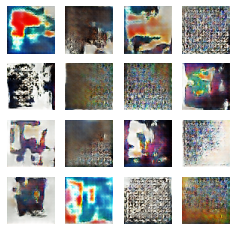

87/87 [==============================] - 17s 190ms/step - d_loss: 0.6570 - g_loss: 0.8578
Epoch 111/150
87/87 [==============================] - ETA: 0s - d_loss: 0.6595 - g_loss: 0.8665

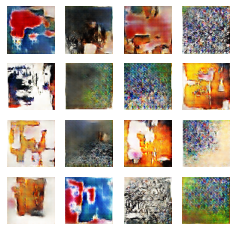

87/87 [==============================] - 18s 192ms/step - d_loss: 0.6595 - g_loss: 0.8665
Epoch 112/150
87/87 [==============================] - ETA: 0s - d_loss: 0.6524 - g_loss: 0.8587

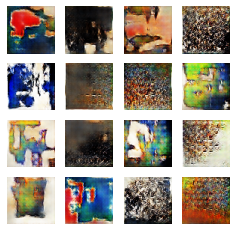

87/87 [==============================] - 17s 188ms/step - d_loss: 0.6524 - g_loss: 0.8587
Epoch 113/150
87/87 [==============================] - ETA: 0s - d_loss: 0.6476 - g_loss: 0.8706

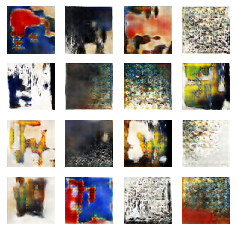

87/87 [==============================] - 18s 192ms/step - d_loss: 0.6476 - g_loss: 0.8706
Epoch 114/150
87/87 [==============================] - ETA: 0s - d_loss: 0.6560 - g_loss: 0.8600

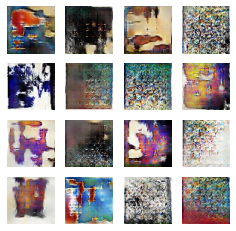

87/87 [==============================] - 18s 192ms/step - d_loss: 0.6560 - g_loss: 0.8600
Epoch 115/150
87/87 [==============================] - ETA: 0s - d_loss: 0.6537 - g_loss: 0.8613

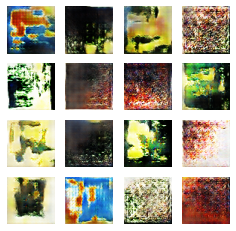

87/87 [==============================] - 18s 195ms/step - d_loss: 0.6537 - g_loss: 0.8613
Epoch 116/150
87/87 [==============================] - ETA: 0s - d_loss: 0.6506 - g_loss: 0.8788

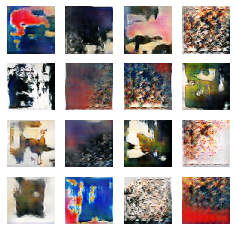

87/87 [==============================] - 18s 193ms/step - d_loss: 0.6506 - g_loss: 0.8788
Epoch 117/150
87/87 [==============================] - ETA: 0s - d_loss: 0.6584 - g_loss: 0.8675

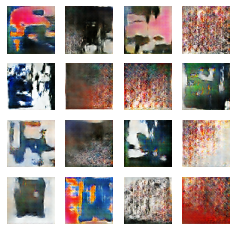

87/87 [==============================] - 17s 180ms/step - d_loss: 0.6584 - g_loss: 0.8675
Epoch 118/150
87/87 [==============================] - ETA: 0s - d_loss: 0.6600 - g_loss: 0.8753

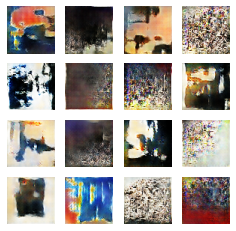

87/87 [==============================] - 18s 194ms/step - d_loss: 0.6600 - g_loss: 0.8753
Epoch 119/150
87/87 [==============================] - ETA: 0s - d_loss: 0.6580 - g_loss: 0.8572

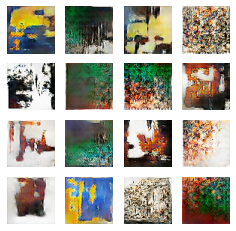

87/87 [==============================] - 19s 198ms/step - d_loss: 0.6580 - g_loss: 0.8572
Epoch 120/150
87/87 [==============================] - ETA: 0s - d_loss: 0.6564 - g_loss: 0.8703

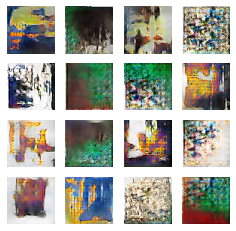

87/87 [==============================] - 18s 190ms/step - d_loss: 0.6564 - g_loss: 0.8703
Epoch 121/150
87/87 [==============================] - ETA: 0s - d_loss: 0.6594 - g_loss: 0.8935

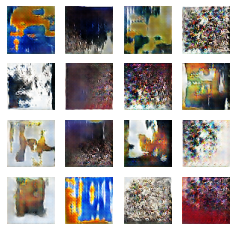

87/87 [==============================] - 17s 188ms/step - d_loss: 0.6594 - g_loss: 0.8935
Epoch 122/150
87/87 [==============================] - ETA: 0s - d_loss: 0.6502 - g_loss: 0.9045

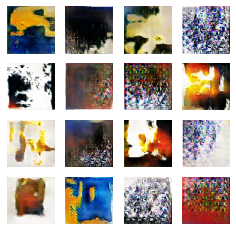

87/87 [==============================] - 18s 198ms/step - d_loss: 0.6502 - g_loss: 0.9045
Epoch 123/150
87/87 [==============================] - ETA: 0s - d_loss: 0.6551 - g_loss: 0.8801

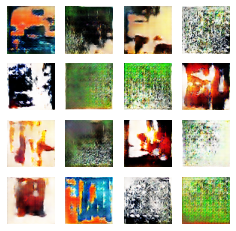

87/87 [==============================] - 17s 189ms/step - d_loss: 0.6551 - g_loss: 0.8801
Epoch 124/150
87/87 [==============================] - ETA: 0s - d_loss: 0.6538 - g_loss: 0.8911

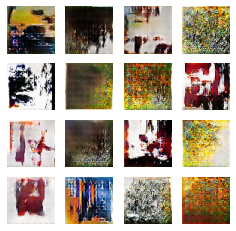

87/87 [==============================] - 18s 200ms/step - d_loss: 0.6538 - g_loss: 0.8911
Epoch 125/150
87/87 [==============================] - ETA: 0s - d_loss: 0.6438 - g_loss: 0.9139

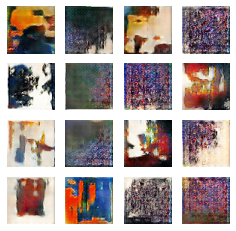

87/87 [==============================] - 18s 191ms/step - d_loss: 0.6438 - g_loss: 0.9139
Epoch 126/150
87/87 [==============================] - ETA: 0s - d_loss: 0.6458 - g_loss: 0.9076

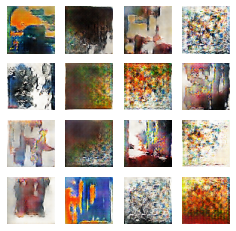

87/87 [==============================] - 19s 201ms/step - d_loss: 0.6458 - g_loss: 0.9076
Epoch 127/150
87/87 [==============================] - ETA: 0s - d_loss: 0.6507 - g_loss: 0.8913

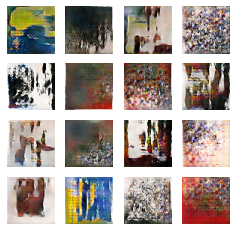

87/87 [==============================] - 19s 207ms/step - d_loss: 0.6507 - g_loss: 0.8913
Epoch 128/150
87/87 [==============================] - ETA: 0s - d_loss: 0.6439 - g_loss: 0.9122

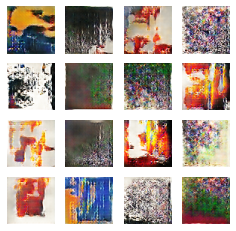

87/87 [==============================] - 18s 194ms/step - d_loss: 0.6439 - g_loss: 0.9122
Epoch 129/150
87/87 [==============================] - ETA: 0s - d_loss: 0.6629 - g_loss: 0.8770

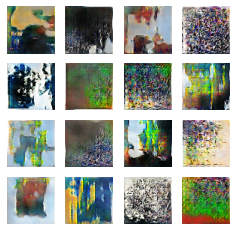

87/87 [==============================] - 18s 200ms/step - d_loss: 0.6629 - g_loss: 0.8770
Epoch 130/150
87/87 [==============================] - ETA: 0s - d_loss: 0.6522 - g_loss: 0.8684

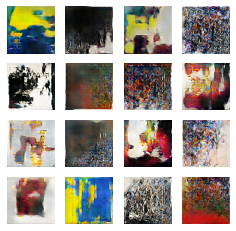

87/87 [==============================] - 19s 202ms/step - d_loss: 0.6522 - g_loss: 0.8684
Epoch 131/150
87/87 [==============================] - ETA: 0s - d_loss: 0.6560 - g_loss: 0.8909

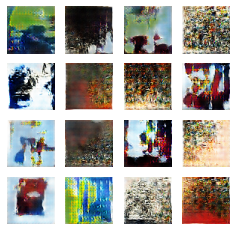

87/87 [==============================] - 19s 203ms/step - d_loss: 0.6560 - g_loss: 0.8909
Epoch 132/150
87/87 [==============================] - ETA: 0s - d_loss: 0.6412 - g_loss: 0.9199

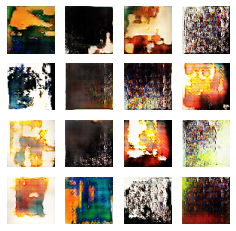

87/87 [==============================] - 19s 201ms/step - d_loss: 0.6412 - g_loss: 0.9199
Epoch 133/150
87/87 [==============================] - ETA: 0s - d_loss: 0.6420 - g_loss: 0.9081

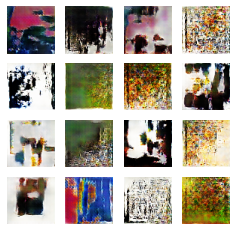

87/87 [==============================] - 18s 197ms/step - d_loss: 0.6420 - g_loss: 0.9081
Epoch 134/150
87/87 [==============================] - ETA: 0s - d_loss: 0.6422 - g_loss: 0.9177

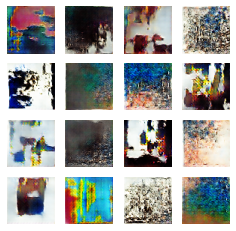

87/87 [==============================] - 19s 200ms/step - d_loss: 0.6422 - g_loss: 0.9177
Epoch 135/150
87/87 [==============================] - ETA: 0s - d_loss: 0.6446 - g_loss: 0.9248

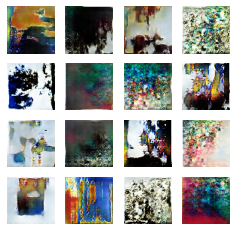

87/87 [==============================] - 19s 200ms/step - d_loss: 0.6446 - g_loss: 0.9248
Epoch 136/150
87/87 [==============================] - ETA: 0s - d_loss: 0.6372 - g_loss: 0.9045

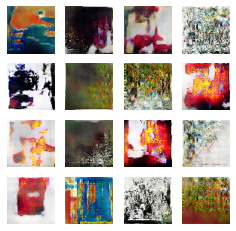

87/87 [==============================] - 18s 198ms/step - d_loss: 0.6372 - g_loss: 0.9045
Epoch 137/150
87/87 [==============================] - ETA: 0s - d_loss: 0.6513 - g_loss: 0.8984

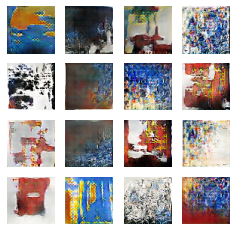

87/87 [==============================] - 19s 200ms/step - d_loss: 0.6513 - g_loss: 0.8984
Epoch 138/150
87/87 [==============================] - ETA: 0s - d_loss: 0.6372 - g_loss: 0.9157

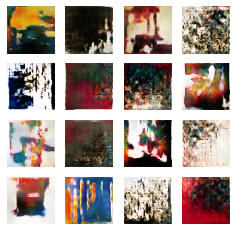

87/87 [==============================] - 19s 202ms/step - d_loss: 0.6372 - g_loss: 0.9157
Epoch 139/150
87/87 [==============================] - ETA: 0s - d_loss: 0.6341 - g_loss: 0.9279

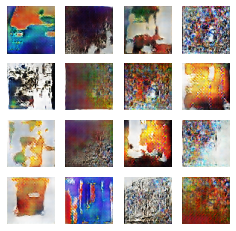

87/87 [==============================] - 18s 194ms/step - d_loss: 0.6341 - g_loss: 0.9279
Epoch 140/150
87/87 [==============================] - ETA: 0s - d_loss: 0.6354 - g_loss: 0.9125

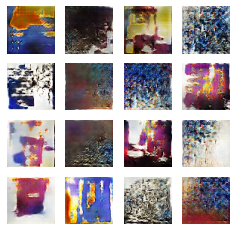

87/87 [==============================] - 18s 189ms/step - d_loss: 0.6354 - g_loss: 0.9125
Epoch 141/150
87/87 [==============================] - ETA: 0s - d_loss: 0.6386 - g_loss: 0.9573

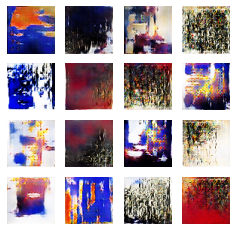

87/87 [==============================] - 18s 194ms/step - d_loss: 0.6386 - g_loss: 0.9573
Epoch 142/150
87/87 [==============================] - ETA: 0s - d_loss: 0.6363 - g_loss: 0.9442

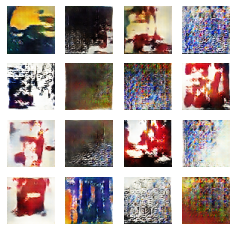

87/87 [==============================] - 18s 194ms/step - d_loss: 0.6363 - g_loss: 0.9442
Epoch 143/150
87/87 [==============================] - ETA: 0s - d_loss: 0.6400 - g_loss: 0.9471

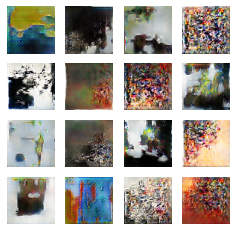

87/87 [==============================] - 18s 200ms/step - d_loss: 0.6400 - g_loss: 0.9471
Epoch 144/150
87/87 [==============================] - ETA: 0s - d_loss: 0.6375 - g_loss: 0.9434

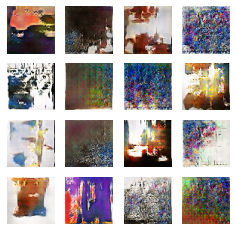

87/87 [==============================] - 18s 195ms/step - d_loss: 0.6375 - g_loss: 0.9434
Epoch 145/150
87/87 [==============================] - ETA: 0s - d_loss: 0.6401 - g_loss: 0.9391

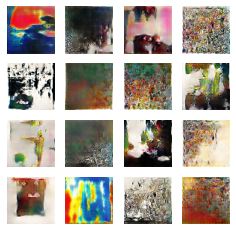

87/87 [==============================] - 18s 201ms/step - d_loss: 0.6401 - g_loss: 0.9391
Epoch 146/150
87/87 [==============================] - ETA: 0s - d_loss: 0.6433 - g_loss: 0.9216

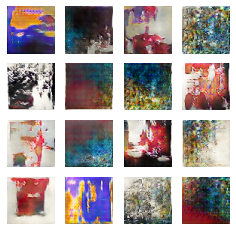

87/87 [==============================] - 18s 188ms/step - d_loss: 0.6433 - g_loss: 0.9216
Epoch 147/150
87/87 [==============================] - ETA: 0s - d_loss: 0.6468 - g_loss: 0.9308

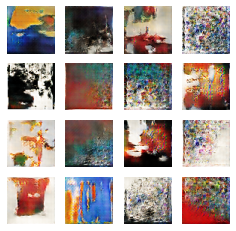

87/87 [==============================] - 17s 187ms/step - d_loss: 0.6468 - g_loss: 0.9308
Epoch 148/150
87/87 [==============================] - ETA: 0s - d_loss: 0.6358 - g_loss: 0.9354

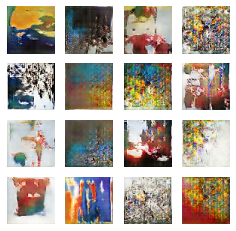

87/87 [==============================] - 19s 202ms/step - d_loss: 0.6358 - g_loss: 0.9354
Epoch 149/150
87/87 [==============================] - ETA: 0s - d_loss: 0.6399 - g_loss: 0.9309

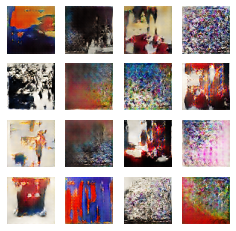

87/87 [==============================] - 19s 198ms/step - d_loss: 0.6399 - g_loss: 0.9309
Epoch 150/150
87/87 [==============================] - ETA: 0s - d_loss: 0.6315 - g_loss: 0.9296

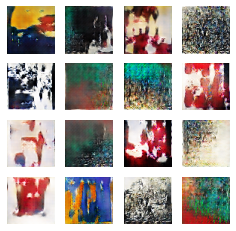

87/87 [==============================] - 19s 203ms/step - d_loss: 0.6315 - g_loss: 0.9296


In [ ]:
NUM_EPOCHS = 150 # number of epochs
dcgan.fit(train_images, epochs=NUM_EPOCHS, callbacks=[GANMonitor(num_img=16, latent_dim=LATENT_DIM)])